In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
import scrublet as scr
import scirpy as ir
#from vpolo.alevin import parser # to parse alevin output
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.api as sm
import statsmodels.stats.multitest as multi

seed = 0
np.random.seed(seed)
%matplotlib inline

import matplotlib as mpl
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis', transparent=False, frameon=False)  # low dpi (dots per inch) yields small inline figures

import matplotlib as mpl
# 2 lines below solved the facecolor problem.
# mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
sc.settings.autosave = True
sc.logging.print_header()

version = '230810_mouse_CD4T_aging'

n_comp = 12

results_file = '../scanpy/{}/res.h5ad'.format(version)

import os
os.makedirs('../scanpy/{}'.format(version), exist_ok=True)

sc.settings.figdir = '../scanpy/{}/graph'.format(version)
sc.settings.cachedir = '../scanpy/{}/cache'.format(version)
# %config InlineBackend.figure_format = 'retina'

import os
os.makedirs('../scanpy/{}'.format(version), exist_ok=True)
os.makedirs(sc.settings.figdir, exist_ok=True)

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.22.4 scipy==1.9.1 pandas==1.3.5 scikit-learn==1.2.2 statsmodels==0.14.0 python-igraph==0.10.4 pynndescent==0.5.10


In [4]:
adata = sc.read_csv('../data/SCP490_mouse_cd4t_aging/RawData1.csv').T
adata

AnnData object with n_obs × n_vars = 24007 × 27998

In [5]:
adata.obs

""
y1_AAACCTGAGGAGTTTA
y1_AAACCTGAGTCGTTTG
y1_AAACCTGCAAGCCCAC
y1_AAACCTGCACAGATTC
y1_AAACCTGCACATCTTT
...
o4_TTTGTCAAGCCGCCTA
o4_TTTGTCACAGTCCTTC
o4_TTTGTCACATTGGTAC
o4_TTTGTCAGTCTCTTAT


In [6]:
df_tsne = pd.read_csv('../data/SCP490_mouse_cd4t_aging/Cluster.txt', sep='\t', index_col=0)
df_tsne = df_tsne.loc[adata.obs.index]
df_tsne['X'] = df_tsne['X'].astype(float)
df_tsne['Y'] = df_tsne['Y'].astype(float)
df_tsne.head()

,X,Y,Subset
y1_AAACCTGAGGAGTTTA,7.195594,-22.434387,Na?ve
y1_AAACCTGAGTCGTTTG,-2.776547,1.076272,Na?ve
y1_AAACCTGCAAGCCCAC,1.204915,-19.438834,Na?ve
y1_AAACCTGCACAGATTC,-1.292982,-1.392766,Na?ve
y1_AAACCTGCACATCTTT,8.405819,-28.592956,Na?ve


In [7]:
adata.obsm['X_tsne'] = np.array(df_tsne.loc[adata.obs.index, ['X', 'Y']])

In [8]:
dict_subset = {'Na?ve' : 'Naive', 
               'TEM' : 'Tem', 
               'Na?ve_Isg15' : 'Naive_Isg15', 
               'rTregs' : 'rTregs', 
               'Exhausted' : 'Exhausted', 
               'aTregs' : 'aTregs',
               'Cytotoxic' : 'Cytotoxic'}

df_metadata = pd.read_csv('../data/SCP490_mouse_cd4t_aging/Metadata.txt', sep='\t', index_col=0)
df_metadata = df_metadata.loc[adata.obs.index]
df_metadata['Subset'] = [dict_subset[x] for x in df_metadata['Subset']]
adata.obs = df_metadata

In [9]:
# sc.pp.filter_genes(adata, min_cells=3)
# adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
# sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
# adata = adata[adata.obs.n_genes_by_counts < 2500, :]
# adata = adata[adata.obs.pct_counts_mt < 5, :]
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
# sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata.raw = adata

normalizing counts per cell
    finished (0:00:00)


/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


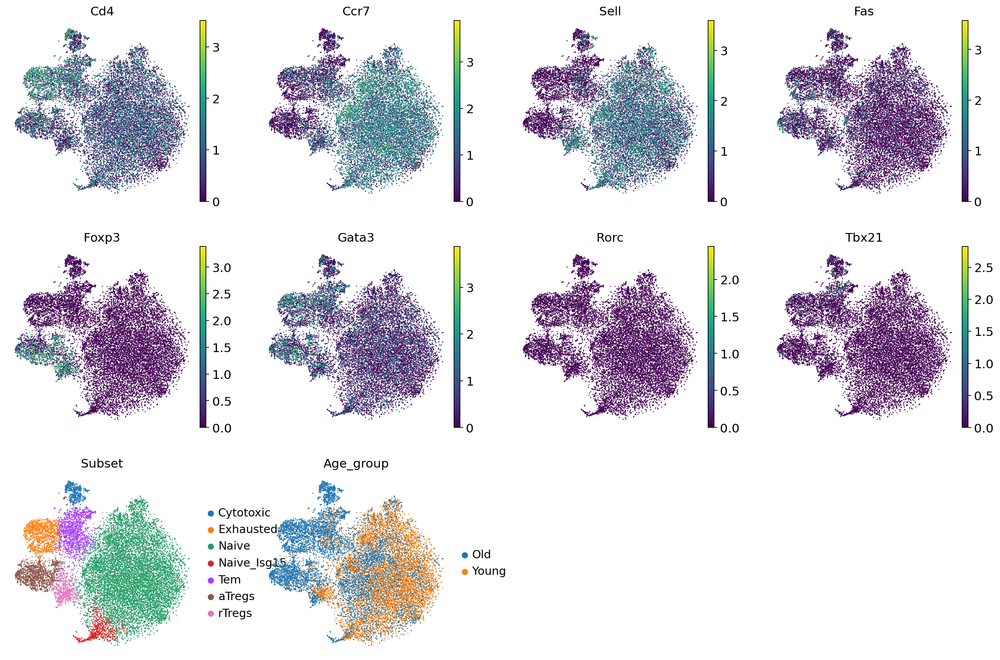

In [10]:
sc.pl.tsne(adata, color=['Cd4', 'Ccr7', 'Sell', 'Fas' ,'Foxp3', 
                         'Gata3', 'Rorc', 'Tbx21', 'Subset', 'Age_group'])

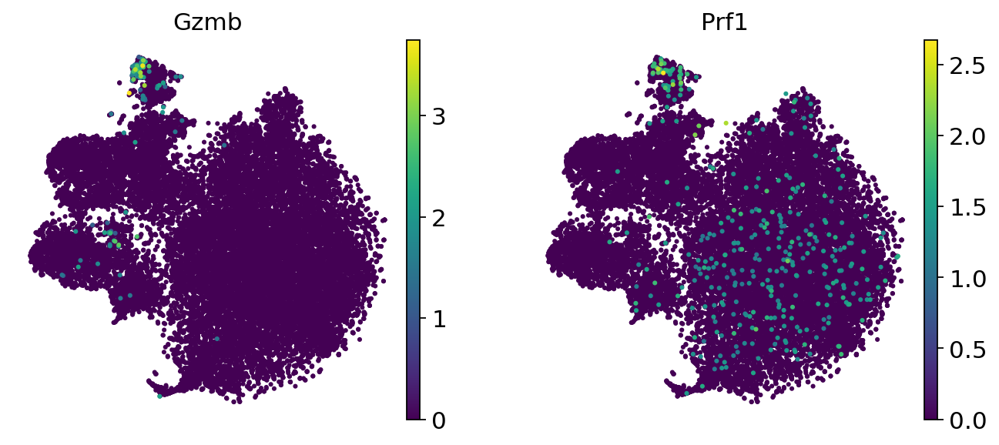

In [11]:
sc.pl.tsne(adata, color=['Gzmb', 'Prf1'], s=30)

In [12]:
adata.obs['Subset'].value_counts()

Naive          15238
Tem             2181
aTregs          1920
Exhausted       1804
Naive_Isg15     1074
rTregs           975
Cytotoxic        815
Name: Subset, dtype: int64

In [13]:
from NMFproj import *

In [14]:
fixed_W = pd.read_csv('../scanpy/220423_STR4.5.21_MS01.02.03.04_MG01.02.03_SL02.03.04_Tcell/NMF.W.CD4T.converted.mouse.csv', index_col=0)

In [15]:
X = adata.to_df().T

In [20]:
X_norm, X_trunc, df_H, fixed_W_trunc = NMFproj(X, fixed_W, return_truncated=True, normalized=True)
df_ev = calc_EV(X_trunc, fixed_W_trunc, df_H)
df_stats = calc_hvg_overlap(X_norm, fixed_W_trunc, min_mean=0.0125, max_mean=3, min_disp=0.1,
                            n_top_genes=500)
print('\n## Stats of overlap of HVGs')
msg = 'Num. genes in fixed W: %s \n' % fixed_W.shape[0]
msg += 'Num. Retained genes (Prop.): %s (%s)\n' % (fixed_W_trunc.shape[0], fixed_W_trunc.shape[0]/fixed_W.shape[0])
msg += 'Prop. overlap of HVGs (POH) : {} in {} query HVGs'.format(
    df_stats.loc[df_stats['highly_variable'], 'selected'].sum() / df_stats['highly_variable'].sum(), 
    df_stats.highly_variable.sum())
print(msg)

/home/yyasumizu/anaconda3/envs/scanpy1.9.1/lib/python3.9/site-packages/NMFproj/NMFproj.py:49: UserWarning: input X looks normalized though normalized flag was not passed
  warnings.warn("input X looks normalized though normalized flag was not passed")


extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)

## Stats of overlap of HVGs
Num. genes in fixed W: 1036 
Num. Retained genes (Prop.): 1036 (1.0)
Prop. overlap of HVGs (POH) : 0.398 in 500 query HVGs


In [23]:
X.max()

y1_AAACCTGAGGAGTTTA    5.339848
y1_AAACCTGAGTCGTTTG    5.215581
y1_AAACCTGCAAGCCCAC    5.573929
y1_AAACCTGCACAGATTC    5.292593
y1_AAACCTGCACATCTTT    5.964033
                         ...   
o4_TTTGTCAAGCCGCCTA    6.099817
o4_TTTGTCACAGTCCTTC    5.926203
o4_TTTGTCACATTGGTAC    5.903343
o4_TTTGTCAGTCTCTTAT    6.858682
o4_TTTGTCATCACATGCA    6.363716
Length: 24007, dtype: float32

In [18]:
X_norm

,y1_AAACCTGAGGAGTTTA,y1_AAACCTGAGTCGTTTG,y1_AAACCTGCAAGCCCAC,y1_AAACCTGCACAGATTC,y1_AAACCTGCACATCTTT,y1_AAACCTGCACATGACT,y1_AAACCTGCATAGTAAG,y1_AAACCTGCATTCCTCG,y1_AAACCTGGTAAGTGGC,y1_AAACCTGGTGGCAAAC,...,o4_TTTGGTTGTACGACCC,o4_TTTGGTTGTATAGGGC,o4_TTTGGTTTCTCGAGTA,o4_TTTGTCAAGATCCGAG,o4_TTTGTCAAGCCACGTC,o4_TTTGTCAAGCCGCCTA,o4_TTTGTCACAGTCCTTC,o4_TTTGTCACATTGGTAC,o4_TTTGTCAGTCTCTTAT,o4_TTTGTCATCACATGCA
Xkr4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0
Gm1992,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0
Gm37381,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0
Rp1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0
Rp1.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AC168977.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0
PISD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.411645,0.0,0.0,0.000000,1.382556,1.321224,0.0,2.291412,0.0
DHRSX,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,1.775692,0.000000,0.000000,0.0,2.291412,0.0
Vmn2r122,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.0


In [21]:
df_ev

,ExplainedVariance
NMF_0,0.004844
NMF_1,0.005107
NMF_2,0.000955
NMF_3,0.045772
NMF_4,0.000693
NMF_5,0.005916
NMF_6,0.021614
NMF_7,0.004780
NMF_8,0.058010
NMF_9,0.008941


In [23]:
df_H.T

,NMF_0,NMF_1,NMF_2,NMF_3,NMF_4,NMF_5,NMF_6,NMF_7,NMF_8,NMF_9,NMF_10,NMF_11
y1_AAACCTGAGGAGTTTA,0.015580,0.000000,0.000000,0.183461,0.0,0.023795,0.000000,0.140751,0.287443,0.000000,0.123670,0.035601
y1_AAACCTGAGTCGTTTG,0.000000,0.000000,0.000000,0.245645,0.0,0.000000,0.135632,0.000000,0.079602,0.085001,0.300111,0.040398
y1_AAACCTGCAAGCCCAC,0.049781,0.000000,0.000000,0.254749,0.0,0.016558,0.002651,0.081493,0.315901,0.073455,0.226174,0.051806
y1_AAACCTGCACAGATTC,0.000000,0.000000,0.000000,0.315931,0.0,0.000000,0.066101,0.015569,0.230829,0.013146,0.143199,0.146966
y1_AAACCTGCACATCTTT,0.000000,0.000000,0.000000,0.234429,0.0,0.091004,0.048896,0.059553,0.188381,0.108956,0.158946,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
o4_TTTGTCAAGCCGCCTA,0.000000,0.000000,0.000000,0.208075,0.0,0.000000,0.090107,0.018537,0.090988,0.034904,0.449102,0.055216
o4_TTTGTCACAGTCCTTC,0.000000,0.000000,0.000000,0.207613,0.0,0.000000,0.063377,0.014869,0.139169,0.016566,0.352114,0.081531
o4_TTTGTCACATTGGTAC,0.000000,0.000000,0.000000,0.225306,0.0,0.094893,0.114305,0.000000,0.198774,0.000000,0.628309,0.000000
o4_TTTGTCAGTCTCTTAT,0.000000,0.443095,0.000000,0.000000,0.0,0.100538,0.099933,0.066385,0.233819,0.082385,0.557703,0.365237


In [28]:
adata.obs = pd.concat([adata.obs, df_H.T], axis=1)

In [25]:
dict_index = {'NMF_0' : 'NMF0 Cytotoxic', 
              'NMF_1' : "NMF1 Treg", 
              'NMF_2' : "NMF2 Th17", 
              'NMF_3' : "NMF3 Naiveness", 
              'NMF_4' : "NMF4 Act", 
              'NMF_5' : "NMF5 Th2", 
              'NMF_6' : "NMF6 Tfh", 
              'NMF_7' : "NMF7 IFN", 
              'NMF_8' : "NMF8 Cent. Mem.", 
              'NMF_9' : "NMF9 Thymic Emi.", 
              'NMF_10' : "NMF10 Resident", 
              'NMF_11' : "NMF11 Th1"}

In [42]:
for k,v in dict_index.items():
    adata.obs[v] = adata.obs[k]

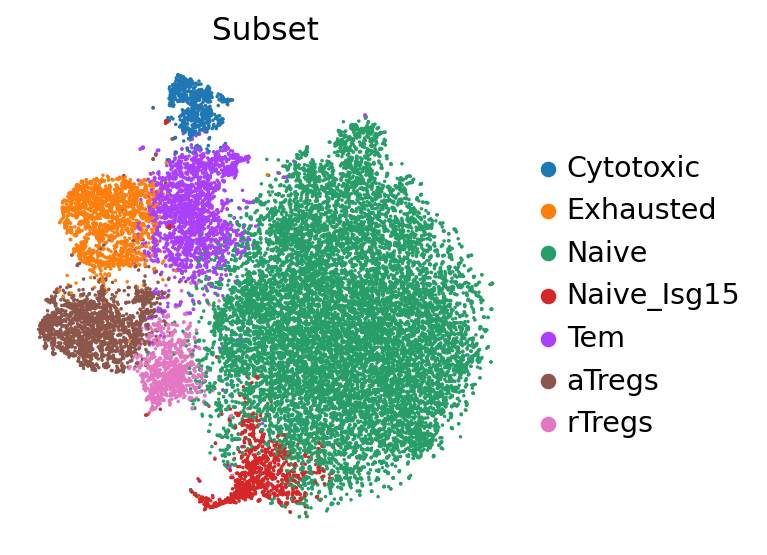

In [46]:
sc.pl.tsne(adata, color=['Subset'], cmap='cividis', sort_order=True, s=10, save='subset')

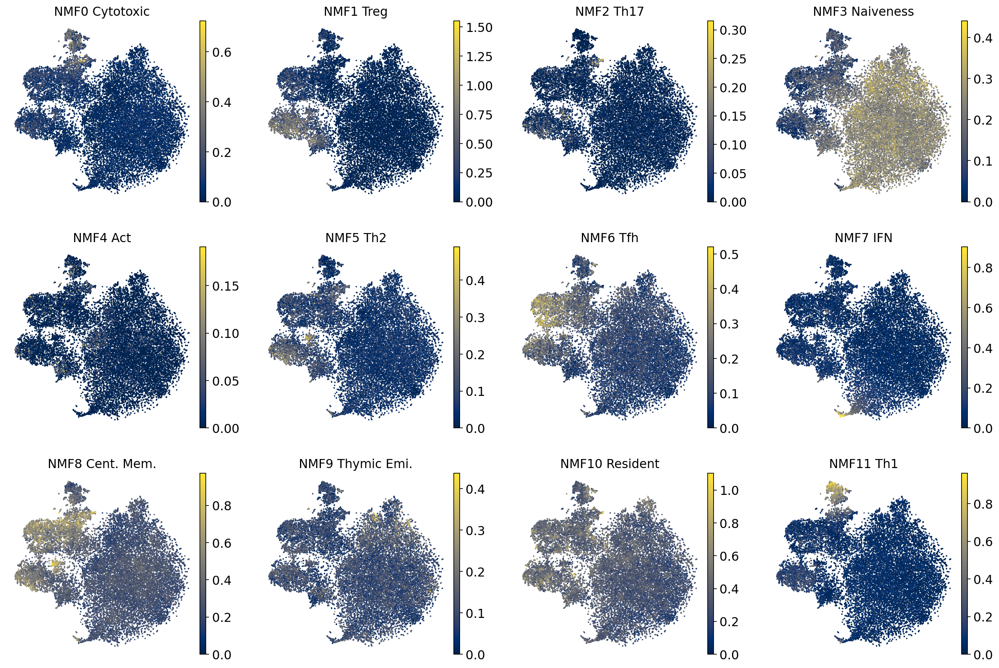

In [44]:
sc.pl.tsne(adata, color=dict_index.values(), cmap='cividis', sort_order=True, s=10, save='NMF')

<Figure size 240x160 with 0 Axes>

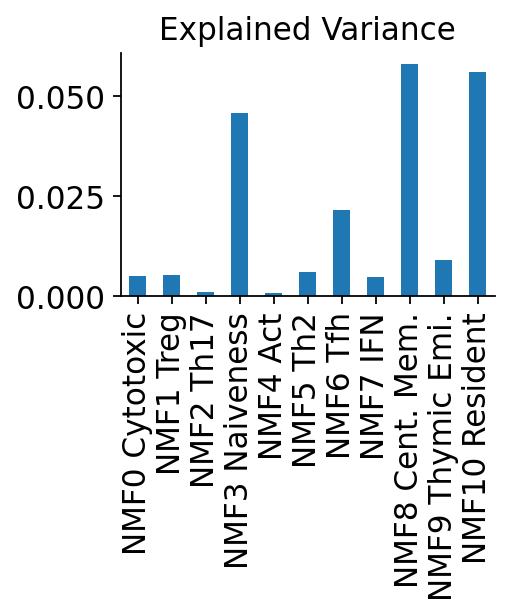

In [65]:
df_ev_plot = df_ev.iloc[:-1]
df_ev_plot.index = dict_index.values()

plt.figure(figsize=(3,2))
df_ev_plot.iloc[:-1].plot.bar(figsize=(3,2), legend=False)
plt.grid(None)
plt.title('Explained Variance')
sns.despine()

In [24]:
df_ev_plot = df_ev.iloc[:-1]
df_ev_plot.index = dict_index.values()

plt.figure(figsize=(3,2))
df_ev_plot.iloc[:-1].plot.bar(figsize=(3,2), legend=False)
plt.grid(None)
plt.title('Explained Variance')
sns.despine()

NameError: name 'dict_index' is not defined

(array([  13.,   78.,  319., 3798., 7678., 5479., 3640., 2218.,  738.,
          46.]),
 array([0.10447975, 0.11216088, 0.11984201, 0.12752314, 0.13520427,
        0.1428854 , 0.15056653, 0.15824765, 0.16592878, 0.17360991,
        0.18129104], dtype=float32),
 <BarContainer object of 10 artists>)

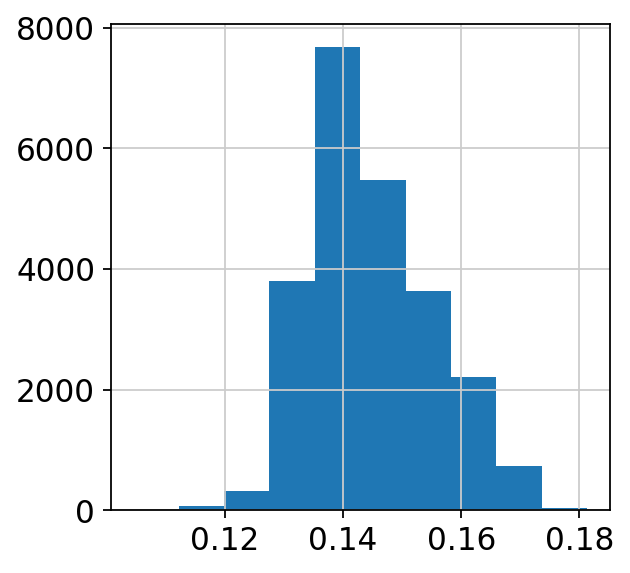

In [70]:
plt.hist(np.var(adata.raw.X, axis=0))

In [156]:
adata.raw.var['variance'] = np.var(adata.raw.X, axis=0)
adata.raw.var['mean'] = np.mean(adata.raw.X, axis=0)
adata.raw.var['max'] = np.max(adata.raw.X, axis=0)
adata.raw.var['std'] = np.std(adata.raw.X, axis=0)

df_stats = adata.raw.var[['variance', 'mean', 'max', 'std']]
df_stats = df_stats[df_stats['max'] > 2]
df_stats = df_stats[df_stats['mean'] > 0.0125]

df_stats['dispersion'] = df_stats['variance'] / df_stats['mean']
df_stats['mean_bin'] = pd.cut(df_stats['mean'], bins=20)
disp_grouped = df_stats.groupby('mean_bin')['dispersion']
disp_mean_bin = disp_grouped.mean()
disp_std_bin = disp_grouped.std(ddof=1)

df_stats['dispersion_norm'] = (
            # use values here as index differs
            df_stats['dispersion'].values
            - disp_mean_bin[df_stats['mean_bin'].values].values
        ) / disp_std_bin[df_stats['mean_bin'].values].values

In [157]:
df_stats['selected'] = df_stats.index.isin(fixed_W.index)

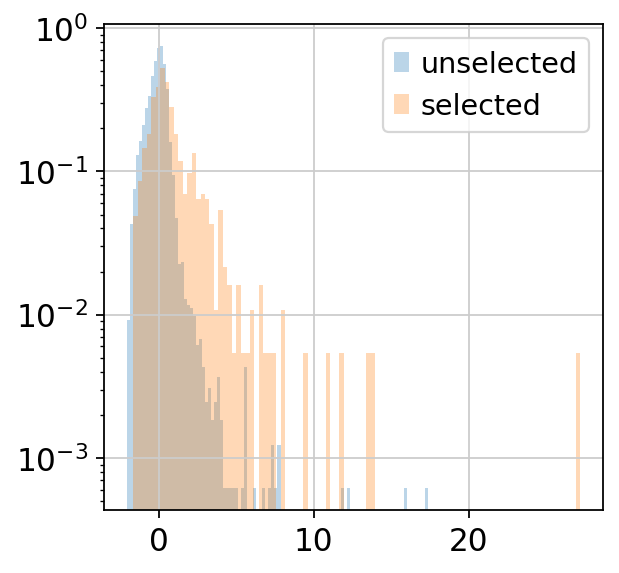

In [158]:
plt.hist(df_stats.loc[~df_stats['selected'],'dispersion_norm'], bins=100, density=True, alpha=0.3, label='unselected')
plt.hist(df_stats.loc[df_stats['selected'], 'dispersion_norm'], bins=100, density=True, alpha=0.3, label='selected')
plt.legend()
plt.yscale('log')

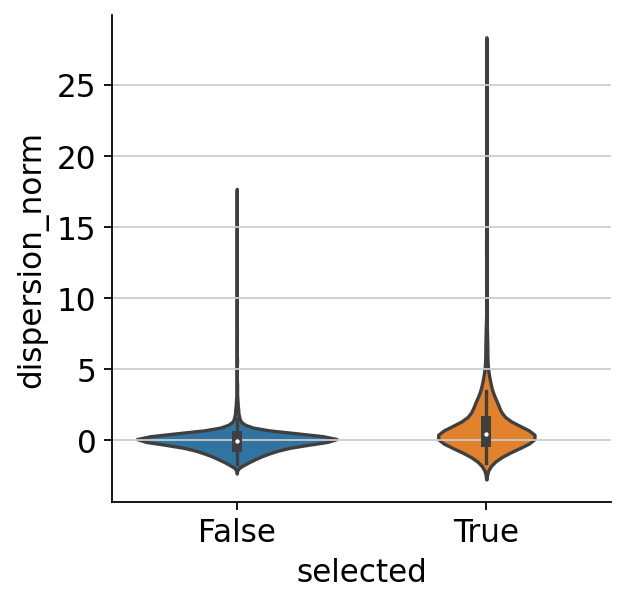

In [159]:
sns.violinplot(data=df_stats, x='selected', y='dispersion_norm')
sns.despine()

In [160]:
# n_top = fixed_W.shape[0]
n_top = 500
n_selected = fixed_W.shape[0]

In [161]:
df_stats['topn'] = df_stats.dispersion_norm.rank(ascending=False) < n_top
df_stats.loc[df_stats.selected, 'topn'].sum() / n_top

0.386

In [162]:
df_stats.selected.sum()

645

In [173]:
a = adata.raw.to_adata()
sc.pp.highly_variable_genes(a, min_mean=0.0125, max_mean=3, min_disp=1)
df_stats = a.var[['dispersions_norm', 'highly_variable']]
df_stats['selected'] = df_stats.index.isin(fixed_W.index)

extracting highly variable genes
    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/tmp/ipykernel_4043750/945093841.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_stats['selected'] = df_stats.index.isin(fixed_W.index)


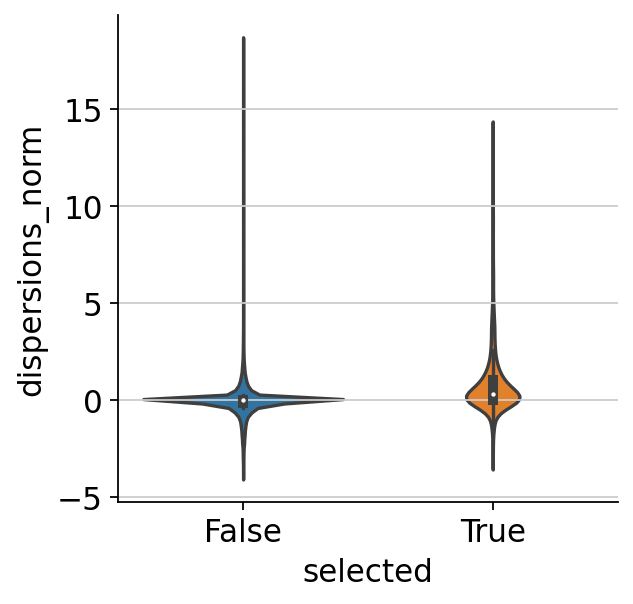

In [174]:
sns.violinplot(data=df_stats, x='selected', y='dispersions_norm')
sns.despine()

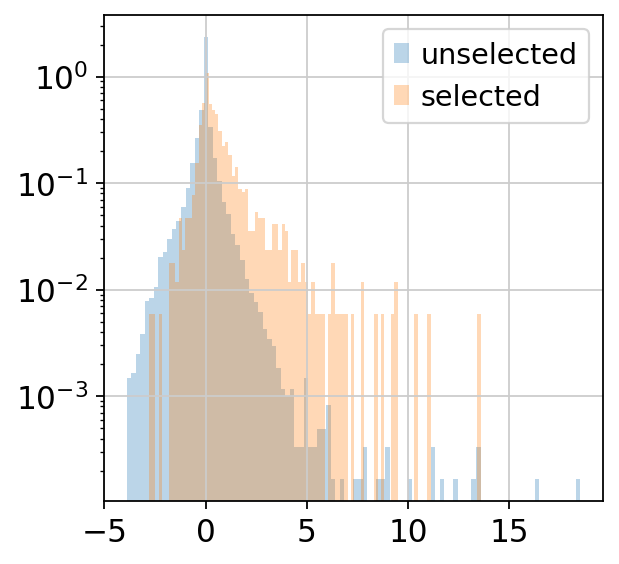

In [175]:
plt.hist(df_stats.loc[~df_stats['selected'],'dispersions_norm'], bins=100, density=True, alpha=0.3, label='unselected')
plt.hist(df_stats.loc[df_stats['selected'], 'dispersions_norm'], bins=100, density=True, alpha=0.3, label='selected')
plt.legend()
plt.yscale('log')

In [176]:
df_stats.loc[df_stats['highly_variable'], 'selected'].sum() / df_stats['highly_variable'].sum()

0.40074906367041196

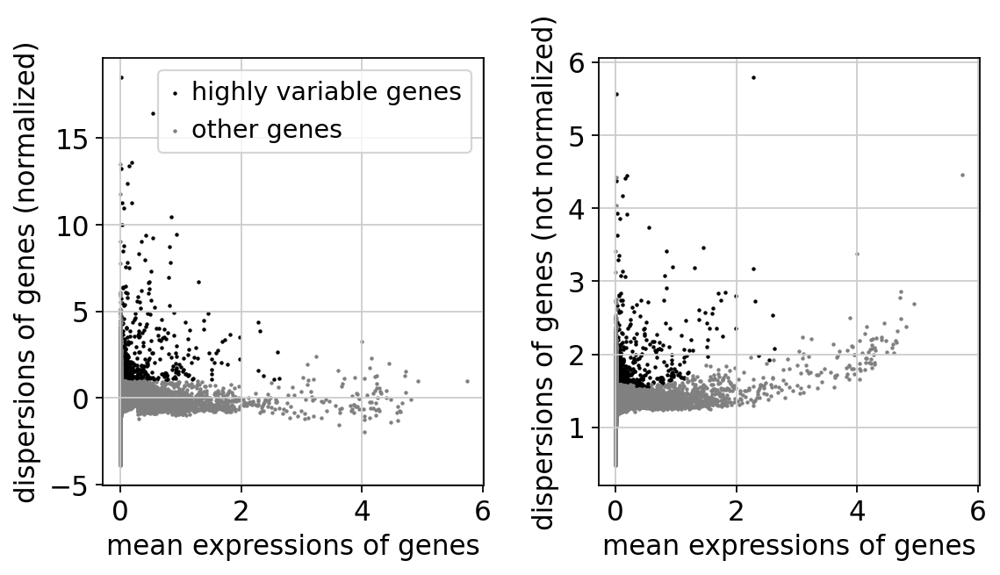

In [177]:
sc.pl.highly_variable_genes(a)

In [178]:
df_stats.highly_variable.sum()

534

In [182]:
sc.AnnData(X)

array([[0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       ...,
       [0.       , 0.       , 0.       , ..., 0.       , 2.2914119,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ],
       [0.       , 0.       , 0.       , ..., 0.       , 0.       ,
        0.       ]], dtype=float32)

In [194]:
a

AnnData object with n_obs × n_vars = 24007 × 27998
    obs: 'nGene', 'nUMI', 'percent.mito', 'Mouse', 'Batch', 'Age_group', 'Subset', 'NMF_0', 'NMF_1', 'NMF_2', 'NMF_3', 'NMF_4', 'NMF_5', 'NMF_6', 'NMF_7', 'NMF_8', 'NMF_9', 'NMF_10', 'NMF_11', 'NMF0 Cytotoxic', 'NMF1 Treg', 'NMF2 Th17', 'NMF3 Naiveness', 'NMF4 Act', 'NMF5 Th2', 'NMF6 Tfh', 'NMF7 IFN', 'NMF8 Cent. Mem.', 'NMF9 Thymic Emi.', 'NMF10 Resident', 'NMF11 Th1'
    var: 'Variance', 'Mean', 'CV', 'Std', 'Dispersion', 'variance', 'mean', 'std', 'max', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'Subset_colors', 'Age_group_colors', 'hvg'
    obsm: 'X_tsne'

In [270]:
def calc_hgv_overlap(X_norm, fixed_W, normalized, min_mean=0.0125, max_mean=3, min_disp=0.1, n_top_genes=500):
#     import scanpy as sc
    tup_blacklist = ('TRAV', 'TRAJ', 'TRBV', 'TRBD', 'TRBJ',
                'TRGV', 'TRGJ', 'TRDV', 'TRDD', 'TRDJ',
                'IGKV', 'IGKJ', 'IGLV', 'IGLJ', 'IGHV', 'IGHD', 'IGHJ')
    if X_norm.index[0] == X_norm.index[0].capitalize():
        tup_blacklist = tuple([x.capitalize() for x in tup_blacklist])

    a = sc.AnnData(X_norm).T
    a = a[:,~a.var.index.str.startswith(tup_blacklist)]
    sc.pp.highly_variable_genes(a, min_mean=min_mean, max_mean=max_mean, min_disp=min_disp, n_bins=200)
    sc.pl.highly_variable_genes(a)
    df_stats = a.var[['dispersions_norm', 'highly_variable', 'means']]
    df_stats['selected'] = df_stats.index.isin(fixed_W.index)
#     df_stats['highly_variable'] = df_stats['highly_variable'] * (df_stats['dispersions_norm'].rank(ascending=False) <= n_top_genes)
    if n_top_genes > 0:
        d = df_stats[df_stats.highly_variable]
        df_stats['highly_variable'] = df_stats.index.isin(list(d[d['dispersions_norm'].rank(ascending=False) <= n_top_genes].index))
        
    return df_stats

extracting highly variable genes
    finished (0:00:07)


Trying to set attribute `.uns` of view, copying.


--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


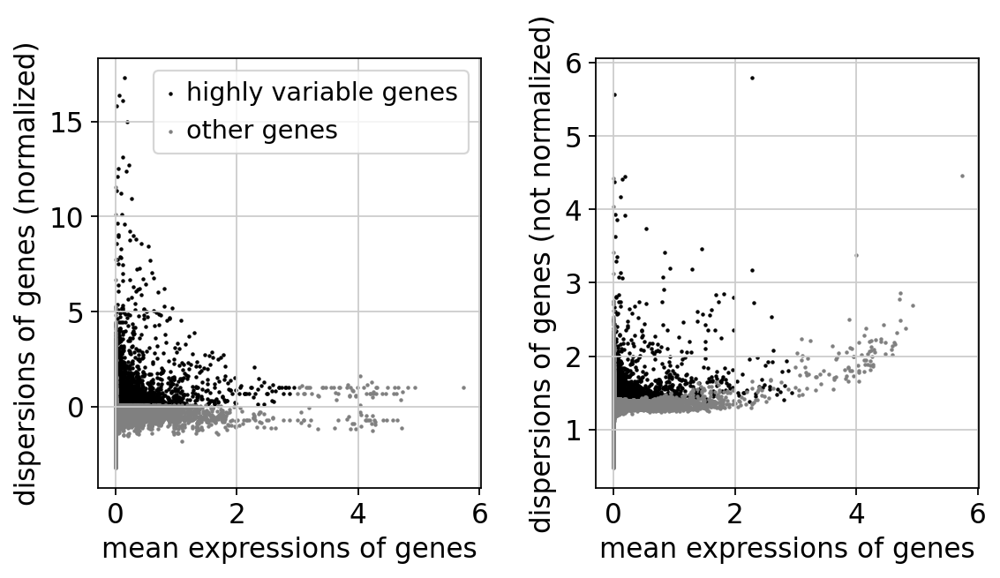

In [271]:
df_stats = calc_hgv_overlap(X, fixed_W, normalized=True)

In [272]:
df_stats

,dispersions_norm,highly_variable,means,selected
Xkr4,0.000000,False,1.000000e-12,False
Gm1992,0.000000,False,1.000000e-12,False
Gm37381,-0.247523,False,4.173947e-04,False
Rp1,0.000000,False,1.000000e-12,False
Rp1.1,0.000000,False,1.000000e-12,False
...,...,...,...,...
AC168977.1,-0.108330,False,2.227025e-02,False
PISD,1.735922,True,7.414339e-01,False
DHRSX,-0.103623,False,2.474542e-01,False
Vmn2r122,0.000000,False,1.000000e-12,False


In [273]:
df_stats.loc[df_stats['highly_variable'], 'selected'].sum() / df_stats['highly_variable'].sum()

0.394

In [274]:
df_stats.highly_variable.sum()

500

In [275]:
(df_stats['highly_variable'] * (df_stats['dispersions_norm'].rank(ascending=False) <= 500)).sum()

291

In [263]:
d = df_stats[df_stats.highly_variable]

In [269]:
df_stats.index.isin(list(d[d['dispersions_norm'].rank(ascending=False) <= 500].index))

array([False, False, False, ..., False, False, False])

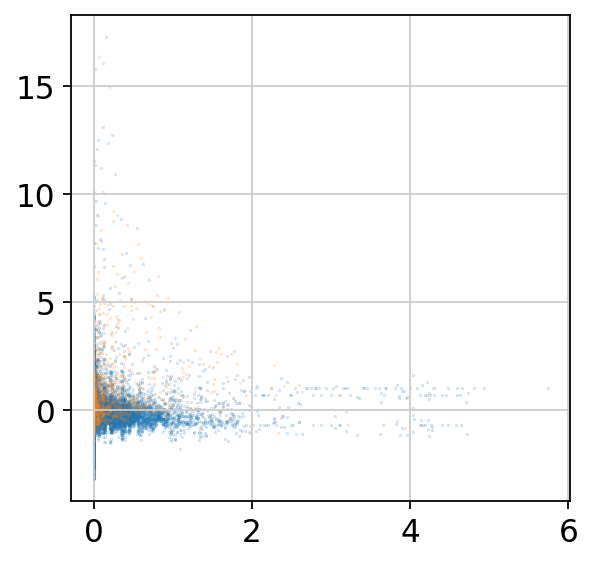

In [251]:
plt.scatter(df_stats.loc[~df_stats['selected'], 'means'], 
            df_stats.loc[~df_stats['selected'], 'dispersions_norm'], s=0.1, alpha=0.3)
plt.scatter(df_stats.loc[df_stats['selected'], 'means'], 
            df_stats.loc[df_stats['selected'], 'dispersions_norm'], s=0.1, alpha=0.3)
# plt.xlim(0.6,1)

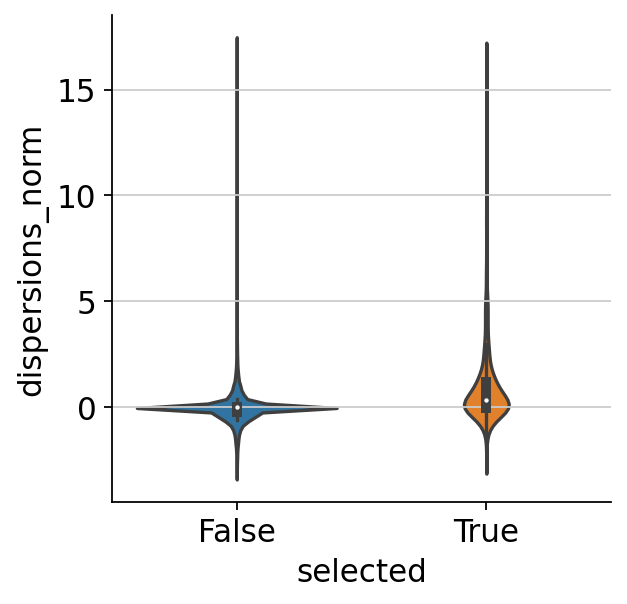

In [252]:
sns.violinplot(data=df_stats, x='selected', y='dispersions_norm')
sns.despine()

In [ ]:
X_norm, df_H, fixed_W  = NMFprojection(X, fixed_W, normalized=True)
df_RMSE = calc_RMSE(X_norm, fixed_W, df_H)
df_ev = calc_EV(X_norm, fixed_W, df_H)

In [114]:
adata.raw.var['Variance'] = np.var(adata.raw.X, axis=0)
adata.raw.var['Std'] = np.std(adata.raw.X, axis=0)
adata.raw.var['Mean'] = np.mean(adata.raw.X, axis=0)
adata.raw.var['CV'] = adata.raw.var['Std'] / adata.raw.var['Mean']
adata.raw.var['Dispersion'] = adata.raw.var['Variance'] / adata.raw.var['Mean']

(array([3.00740256e+01, 4.41942654e+00, 3.56880958e+00, 2.78246171e+00,
        2.50648385e+00, 2.07928575e+00, 1.80330694e+00, 1.43281691e+00,
        1.38745000e+00, 1.23244877e+00, 1.12659537e+00, 9.37568390e-01,
        7.82567164e-01, 7.71225611e-01, 7.14518540e-01, 6.91834740e-01,
        5.85980813e-01, 5.14149908e-01, 4.72565172e-01, 4.91466824e-01,
        4.42321001e-01, 2.94880667e-01, 3.32685234e-01, 3.21344317e-01,
        3.21344317e-01, 2.83538552e-01, 2.23050761e-01, 2.57075454e-01,
        2.00367243e-01, 1.73903983e-01, 2.00367243e-01, 2.15489719e-01,
        2.15489719e-01, 1.43659533e-01, 1.96586729e-01, 1.58782207e-01,
        1.62562103e-01, 1.09634907e-01, 1.47440620e-01, 1.32317991e-01,
        1.32317991e-01, 9.45132182e-02, 1.58781589e-01, 1.32317991e-01,
        1.36099034e-01, 1.32317991e-01, 8.31713086e-02, 1.17196391e-01,
        9.45128507e-02, 9.82933647e-02, 7.56105745e-02, 6.80492525e-02,
        9.82933647e-02, 1.28537477e-01, 1.39879563e-01, 1.247569

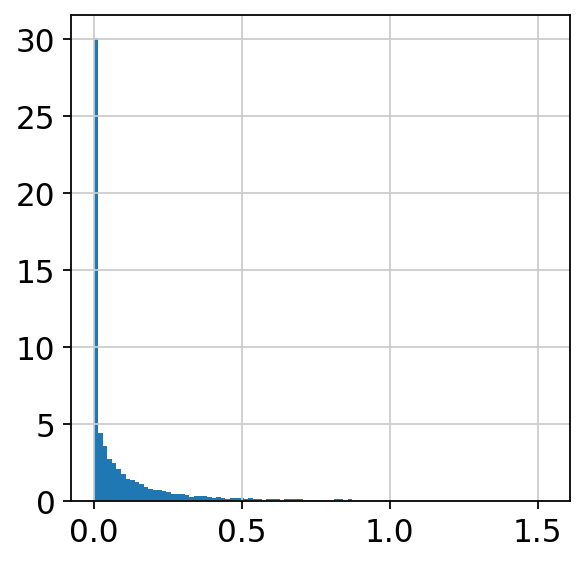

In [95]:
plt.hist(adata.raw.var.loc[adata.raw.var.Mean > 0 , 'Variance'], bins=100, density=True)

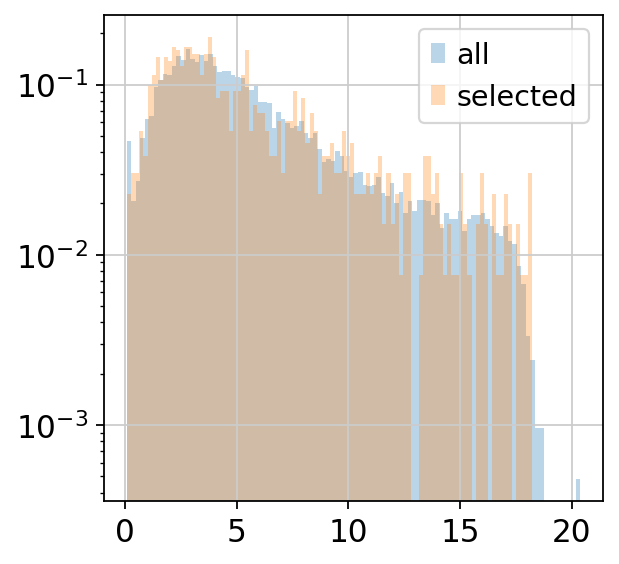

In [113]:
plt.hist(adata.raw.var.loc[adata.raw.var.Mean > 0.004794941 , 'CV'], bins=100, density=True, alpha=0.3, label='all')
plt.hist(adata.raw[:,fixed_W.index].var.loc[adata.raw.var.Mean > 0.004794941, 'CV'], bins=100, density=True, alpha=0.3, label='selected')
plt.legend()
plt.yscale('log')

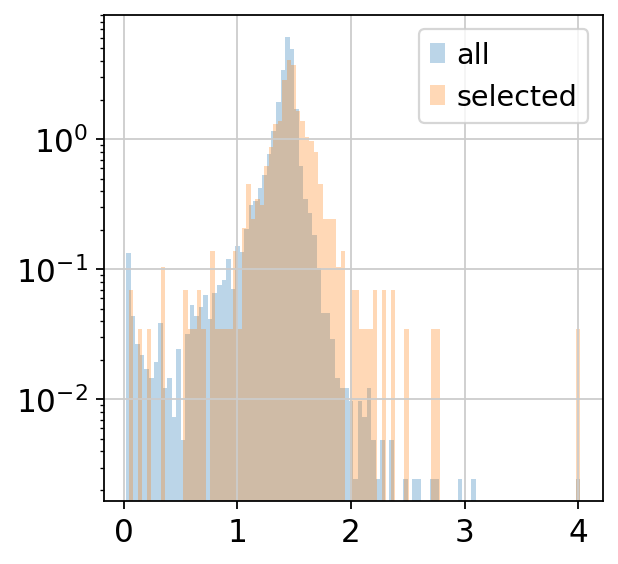

In [115]:
plt.hist(adata.raw.var.loc[adata.raw.var.Mean > 0.004794941 , 'Dispersion'], bins=100, density=True, alpha=0.3, label='all')
plt.hist(adata.raw[:,fixed_W.index].var.loc[adata.raw.var.Mean > 0.004794941, 'Dispersion'], bins=100, density=True, alpha=0.3, label='selected')
plt.legend()
plt.yscale('log')

(array([21.76473899,  5.55533548,  4.64212933,  3.50062212,  2.51131655,
         3.19621933,  1.75031153,  1.36980828,  1.67421103,  1.44590874,
         1.67421012,  1.14150814,  1.21760736,  1.44590874,  0.83710597,
         1.1415069 ,  0.98930598,  0.98930598,  0.68490414,  0.91320651,
         0.30440217,  0.60880302,  0.83710597,  0.22830163,  0.45660226,
         0.60880434,  0.45660226,  0.38050271,  0.60880434,  0.45660226,
         0.15220109,  0.15220109,  0.60880302,  0.38050271,  0.38050271,
         0.15220075,  0.22830163,  0.30440151,  0.45660425,  0.15220075,
         0.15220075,  0.38050189,  0.07610071,  0.30440151,  0.15220075,
         0.30440283,  0.22830113,  0.60880302,  0.30440283,  0.22830113,
         0.        ,  0.07610071,  0.07610038,  0.07610038,  0.        ,
         0.22830113,  0.        ,  0.15220142,  0.15220075,  0.22830113,
         0.07610071,  0.22830113,  0.22830113,  0.07610071,  0.22830113,
         0.15220075,  0.        ,  0.22830212,  0.0

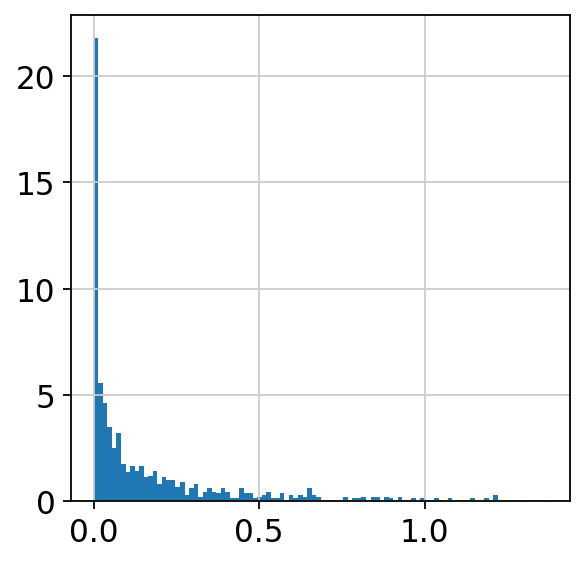

In [97]:
plt.hist(adata.raw[:,fixed_W.index].var.loc[adata.raw.var.Mean > 0, 'Variance'], bins=100, density=True)

(array([0.05325891, 0.11393362, 0.09168623, 0.06606801, 0.04112396,
        0.03640483, 0.02629236, 0.01752825, 0.01550576, 0.01011245,
        0.01078661, 0.01011246, 0.01348326, 0.00674163, 0.01078662,
        0.0128091 , 0.0053933 , 0.00269666, 0.00741579, 0.00471914,
        0.00202249, 0.00134833, 0.00134833, 0.00337082, 0.00404498,
        0.00134833, 0.00269665, 0.00471914, 0.00202249, 0.00202249,
        0.00337082, 0.00202249, 0.00269665, 0.00269665, 0.00202249,
        0.00134833, 0.00134833, 0.        , 0.00067416, 0.00067416,
        0.00067416, 0.00539329, 0.00067416, 0.        , 0.00067416,
        0.00471915, 0.00134832, 0.        , 0.        , 0.        ,
        0.        , 0.00067416, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.00404499, 0.00269665, 0.        ,
        0.00067416, 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.        , 0.        , 0.        ,
        0.00741578, 0.00202249, 0.00067416, 0.  

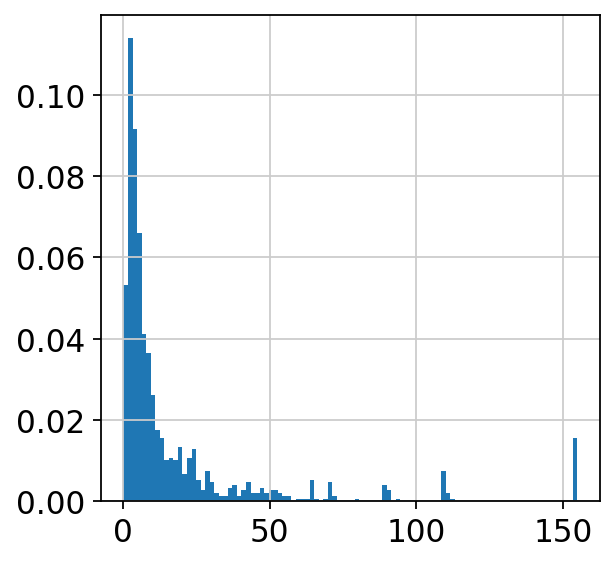

In [101]:
plt.hist(adata.raw[:,fixed_W.index].var.loc[adata.raw.var.Mean > 0, 'CV'], bins=100, density=True)

In [277]:
from sklearn.decomposition import NMF

import sys
sys.path.append('/home/yyasumizu/media32TB/bioinformatics/yyoshiaki-git/NMFprojection/')

from NMFprojection import *

In [282]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)
adata.raw = adata
adata = adata[:, adata.var.highly_variable]

extracting highly variable genes
    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [283]:
arr_exp = adata.X
arr_exp = np.where(arr_exp > 0, arr_exp, 0)

In [284]:
arr_exp.shape

(24007, 1179)

In [285]:
%%time

list_evar = []
for n_comp in range(1,19):
    model = NMF(n_components=n_comp, init='random', random_state=seed)
    W = model.fit_transform(arr_exp)
    H = model.components_

    df_evar = calc_EV(arr_exp.T, pd.DataFrame(H).T, pd.DataFrame(W).T)
    evar = df_evar.loc['ALL', 'ExplainedVariance']
    corr = (np.array(pd.DataFrame(H).T.corr()) - np.eye(n_comp)).max()
    
    list_evar.append([n_comp, evar, corr])

/home/yyasumizu/anaconda3/envs/scanpy1.8.1/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"
/home/yyasumizu/anaconda3/envs/scanpy1.8.1/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"
/home/yyasumizu/anaconda3/envs/scanpy1.8.1/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"
/home/yyasumizu/anaconda3/envs/scanpy1.8.1/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 rea

CPU times: user 27min 8s, sys: 10min 39s, total: 37min 47s
Wall time: 2min 56s


In [286]:
df_evar = pd.DataFrame(list_evar, columns=['n_comp', 'Evar', 'corr'])
# df_evar.to_csv(str(sc.settings.figdir) + '/stats_components_NMF.csv')
df_evar

,n_comp,Evar,corr
0,1,0.369379,0.000000
1,2,0.402425,0.679915
2,3,0.412385,0.668565
3,4,0.418933,0.610413
4,5,0.424886,0.526158
5,6,0.431425,0.521715
6,7,0.436363,0.525884
7,8,0.440526,0.528803
8,9,0.445000,0.607139
9,10,0.448687,0.562055


In [298]:
n_comp = 14

Text(0.5, 8.777777777777784, '# Components')

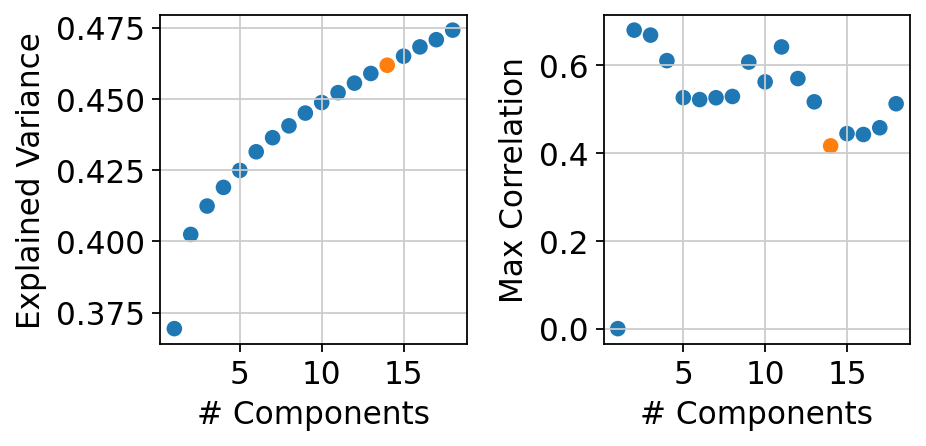

In [299]:
plt.figure(figsize=(6,3))
plt.subplot(1,2,1)
# plt.scatter(df_evar['n_comp'], df_evar['Evar'])
plt.scatter(df_evar['n_comp'], df_evar['Evar'], c=['tab:blue' if n_c != n_comp else 'tab:orange' for n_c in df_evar.n_comp])

plt.ylabel('Explained Variance')
plt.xlabel('# Components')

plt.subplot(1,2,2)
# plt.scatter(df_evar['n_comp'], df_evar['corr'])
plt.scatter(df_evar['n_comp'], df_evar['corr'], c=['tab:blue' if n_c != n_comp else 'tab:orange' for n_c in df_evar.n_comp])
plt.ylabel('Max Correlation')
plt.tight_layout()
plt.xlabel('# Components')

# plt.savefig(str(sc.settings.figdir) + '/stats_components_NMF.pdf', bbox_inches='tight')

In [302]:
n_comp = 14

In [303]:
model = NMF(n_components=n_comp, init='random', random_state=0)
W = model.fit_transform(arr_exp)
H = model.components_

l_evar = []
for c in range(n_comp):
    #     l_rss.append(np.sum((np.matmul(W[:,[c]], H[[c],:])) ** 2) / np.sum(X ** 2))
    l_evar.append(1 - (np.sum((arr_exp - np.matmul(W[:,[c]], H[[c],:])) ** 2) / np.sum(arr_exp ** 2)))
    
for c in range(n_comp):
    adata.obs['NMF_{}'.format(c)] = W[:,[c]]
    adata.var['NMF_{}'.format(c)] = H[c,:]
# adata.var[['NMF_{}'.format(c) for c in range(n_comp)]].to_csv('./data/NMF.W.PBMC.csv')

/home/yyasumizu/anaconda3/envs/scanpy1.8.1/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"
Trying to set attribute `.obs` of view, copying.


Text(0, 0.5, 'Explained Variance')

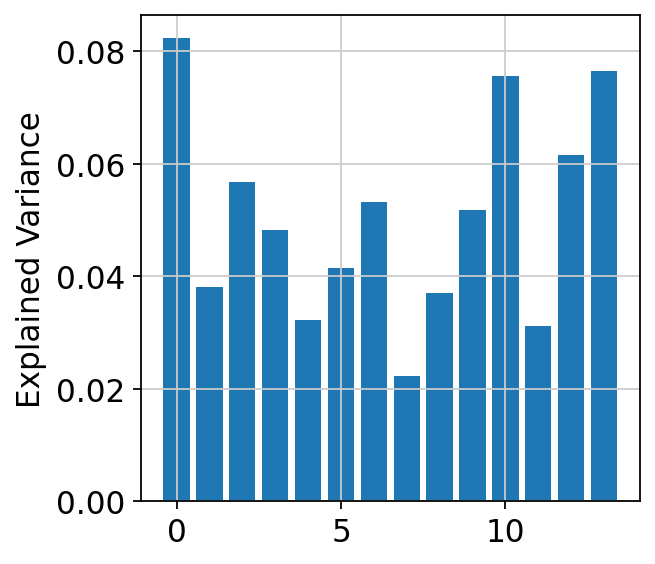

In [304]:
plt.bar(range(n_comp), l_evar)
plt.ylabel('Explained Variance')

In [307]:
%%time
for c in range(n_comp):
    adata.raw.var['corr_NMF_{}'.format(c)] = np.corrcoef(adata.raw.X.T, adata.obs['NMF_{}'.format(c)])[-1,:-1]

/home/yyasumizu/anaconda3/envs/scanpy1.8.1/lib/python3.8/site-packages/numpy/lib/function_base.py:2642: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/yyasumizu/anaconda3/envs/scanpy1.8.1/lib/python3.8/site-packages/numpy/lib/function_base.py:2643: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


CPU times: user 2h 22min 23s, sys: 10min 24s, total: 2h 32min 47s
Wall time: 12min 49s


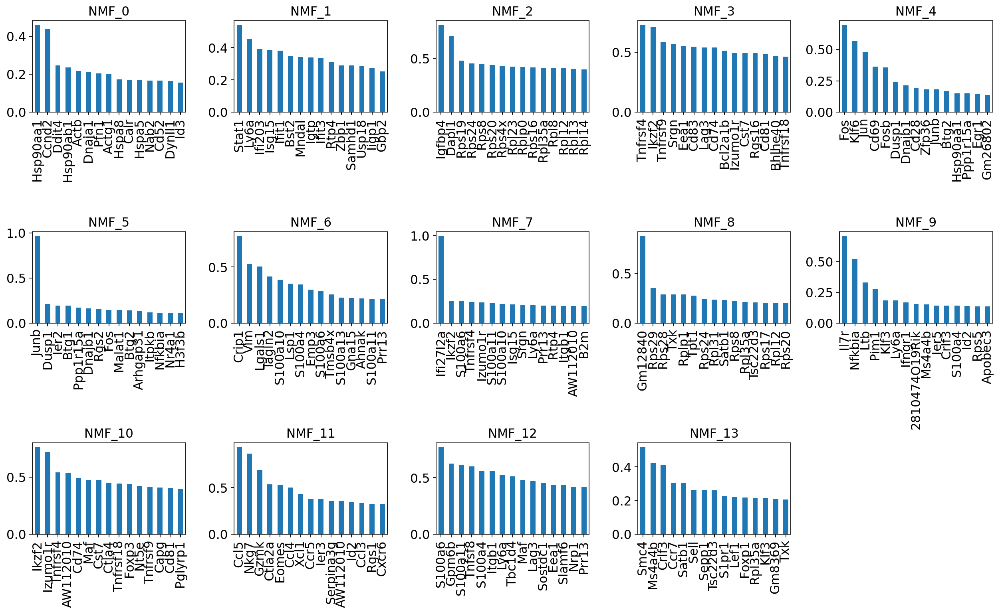

In [308]:
plt.figure(figsize=(16,12))
for i,c in enumerate(range(n_comp)):
    plt.subplot(4,5,i+1)
    adata.raw.var['corr_NMF_{}'.format(c)].sort_values(ascending=False).head(15).plot.bar()
    plt.grid(False)
    plt.title('NMF_{}'.format(c))
plt.tight_layout()

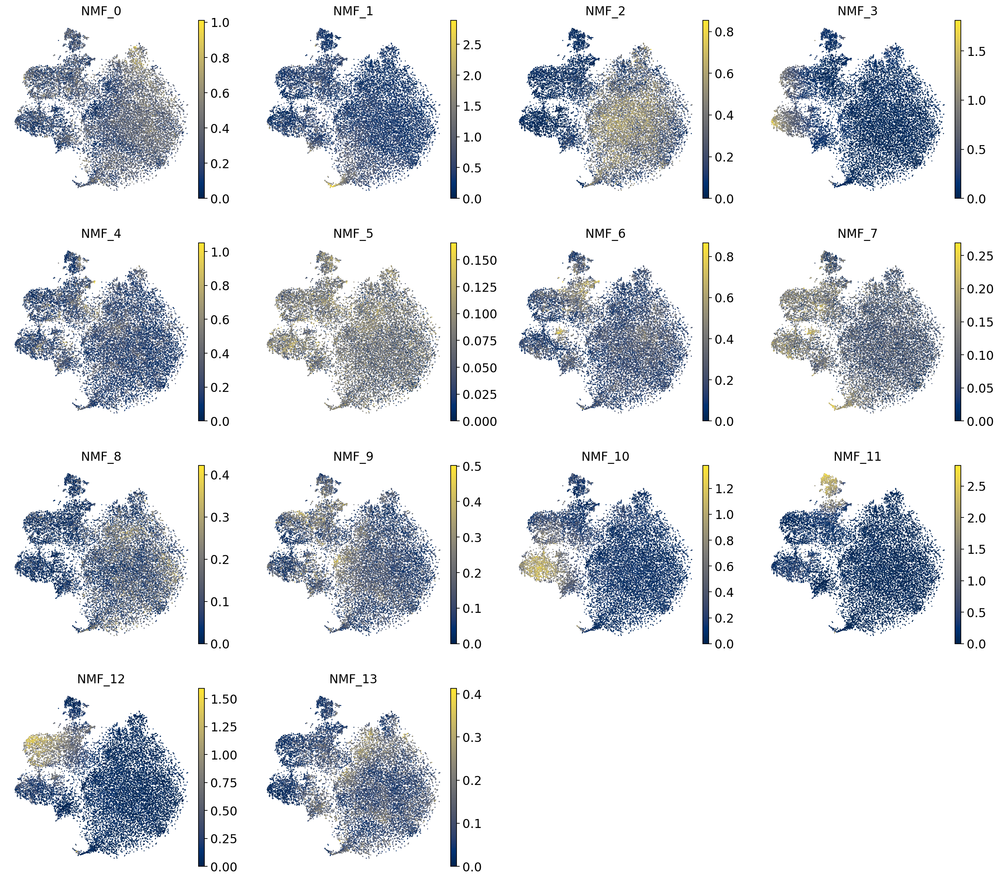

In [310]:
sc.pl.tsne(adata, color=['NMF_{}'.format(c) for c in range(n_comp)], cmap='cividis')

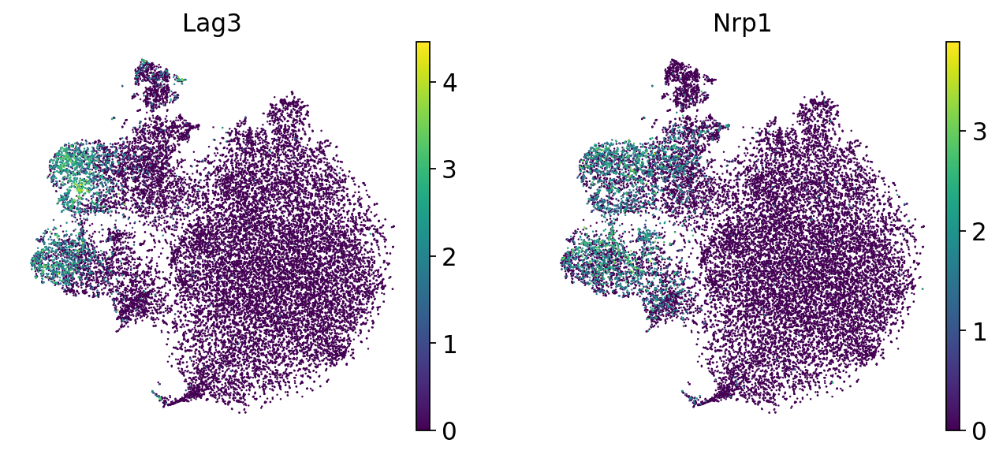

In [311]:
sc.pl.tsne(adata, color=['Lag3', 'Nrp1'], cmap='viridis')